In [1]:
#The script is for the B cell annotation of the remapped data
import scanpy as sc #for scanpy >= 1.3.7
import anndata as ann
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
import logging
import os
import glob
import matplotlib
import math

In [9]:
def removegenes(adata):
    """remove human HLA genes from the dataset 
    Parameters:
    ----------
    adata: scanpy.adata
        scanpy adata object

    Returns:
    -------
    temp: scanpy.adata
        scanpy adata object
    """
    IGKV = [x for x in adata.var_names if x.startswith('IGKV')]
    IGHV = [x for x in adata.var_names if x.startswith('IGHV')]
    IGLV = [x for x in adata.var_names if x.startswith('IGLV')]
    IGLC = [x for x in adata.var_names if x.startswith('IGLC')]
    IGLL = [x for x in adata.var_names if x.startswith('IGLL')]
    IGKC = [x for x in adata.var_names if x.startswith('IGKC')]
    IGHC = [x for x in adata.var_names if x.startswith('IGHC')]
    TRAV = [x for x in adata.var_names if x.startswith('TRAV')]
    TRBV = [x for x in adata.var_names if x.startswith('TRBV')]
    
    exclude = IGKV + IGHV + IGLV + IGKC + IGHC + IGLL + IGLC+TRAV + TRBV 
    gene = [x for x in adata.var_names if x not in exclude]
    temp = adata[:,gene].copy()
    return(temp)

In [16]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score


def sil_cal(adata, res_list, n_knn_pcs):
    key_list = []
    for res in res_list:
        key_list.append('res_{}'.format(res))
        sc.tl.leiden(adata, resolution=res, key_added = 'res_{}'.format(res))
        
    pca_matrix = adata.obsm['X_pca'][:,0:n_knn_pcs]
    sil_df = pd.DataFrame(index = adata.obs.index, columns = key_list)
    info_df = pd.DataFrame(index = key_list, columns = ['n_clusters', 'sil_avg', 'res'])
    
    info_df['res'] = res_list
    
    for res_name in key_list:
        
        labels = adata.obs[res_name].to_numpy(dtype = int)
        n_clusters = len(adata.obs[res_name].unique())
        
        info_df.loc[res_name, 'n_clusters'] = n_clusters
        
        if labels.sum() == 0:
            print('At resolution {} only 1 cluster is defined, skip to the next resolution'.format(res_name.split('_')[1]))
            sil_df[res_name] = 0
            info_df.loc[res_name, 'sil_avg'] = 0
            continue
        else:
            silhouette_avg = silhouette_score(pca_matrix, adata.obs[res_name].to_numpy(dtype = int))
            sample_silhouette_values = silhouette_samples(pca_matrix, adata.obs[res_name].to_numpy(dtype = int))
            sil_df[res_name] = sample_silhouette_values
            info_df.loc[res_name, 'sil_avg'] = silhouette_avg
            print('At resolution {} the average silhouette score is {}'.format(res_name.split('_')[1], silhouette_avg))
            
    return(sil_df, info_df)

def summary_plot(info_df, path, name):
    temp_df = info_df.loc[info_df.sil_avg != 0]
    
    rcParams['figure.figsize']=(20,10)
    rcParams['font.size']=22
    fig, (ax1, ax2) = plt.subplots(1, 2)
    sb.scatterplot(data = temp_df, x = 'res', y = 'sil_avg',s =200, 
                   alpha = 0.5, color = 'black', edgecolor = 'k', ax = ax1)
    sb.scatterplot(data = temp_df, x = 'n_clusters', y = 'sil_avg',s =200, alpha = 0.5, 
                   color = 'black', edgecolor = 'k', ax = ax2)
    
    ax1.set_xlabel("Resolution")
    ax1.set_ylabel("Average silhouette score")
    ax2.set_xlabel("Cluster numbers")
    ax2.set_ylabel("Average silhouette score")

    save_dir = os.path.join(path, name)
    fig.savefig(save_dir, bbox_inches='tight')
#   plt.close()

def pca_elbow(adata, n_genes, n_pca_pcs, name):
    rcParams['figure.figsize']=(8,8)
    rcParams['font.size']=16
    
    sc.pp.highly_variable_genes(adata, flavor='cell_ranger', n_top_genes=n_genes)
    sc.pp.pca(adata, n_comps=n_pca_pcs, use_highly_variable=True, svd_solver='arpack')
    sc.pl.pca_variance_ratio(adata, log=False, save = '_{}.png'.format(name))

In [2]:
#load dataset
path = '/domino/edv/id-td-virology/Zhiyuan/public/Gut_remap/processed_data/pp_2.h5ad'
adata = sc.read_h5ad(path)

In [3]:
adata

AnnData object with n_obs × n_vars = 293560 × 36601
    obs: 'sample_id', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'total_counts_mt', 'pct_counts_mt', 'cell_quality'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [4]:
meta_path = '/domino/edv/id-td-virology/Zhiyuan/public/Gut_remap/processed_data/B_meta.tsv'
metadata_B = pd.read_csv(meta_path, sep = '\t')

In [5]:
metadata_B

,sample_id,n_genes_by_counts,total_counts,pct_counts_in_top_50_genes,total_counts_mt,pct_counts_mt,cell_quality,nCount_RNA,nFeature_RNA,RNA_snn_res.0.1,seurat_clusters,clusternames
AAGTCTGGTGATGTCT-1-P190801_Liver_1,P190801_Liver_1,1340,3115,31.300161,178,5.714286,high,3115,1340,5,5,B
AATCGGTCAGCGTCCA-1-P190801_Liver_1,P190801_Liver_1,1448,10171,75.892243,349,3.431324,high,10171,1448,10,10,B
ACACTGAGTCTGCCAG-1-P190801_Liver_1,P190801_Liver_1,1514,7657,65.129946,750,9.794959,high,7657,1514,10,10,B
ACATGGTAGGTTCCTA-1-P190801_Liver_1,P190801_Liver_1,1823,5402,36.023695,239,4.424287,high,5402,1823,5,5,B
ACATGGTGTTTCGCTC-1-P190801_Liver_1,P190801_Liver_1,1312,3733,39.646397,286,7.661398,high,3733,1312,5,5,B
...,...,...,...,...,...,...,...,...,...,...,...,...
TTTCCTCTCTCAACTT-1-P190402_Liver_1,P190402_Liver_1,2436,7237,29.625535,390,5.388973,high,7237,2436,5,5,B
TTTGCGCGTAAGTTCC-1-P190402_Liver_1,P190402_Liver_1,2194,19672,68.340789,142,0.721838,high,19672,2194,10,10,B
TTTGGTTCAAGTCATC-1-P190402_Liver_1,P190402_Liver_1,1480,3566,31.660123,216,6.057207,high,3566,1480,5,5,B
TTTGGTTGTTACCGAT-1-P190402_Liver_1,P190402_Liver_1,1750,5493,34.516658,163,2.967413,high,5493,1750,5,5,B


In [30]:
#subset the adata based on the metadata and replace the metadata
ind = metadata_B.index
adata_B = adata[ind,:].copy()
adata_B.obs = metadata_B

In [31]:
adata_B

AnnData object with n_obs × n_vars = 29477 × 36601
    obs: 'sample_id', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'total_counts_mt', 'pct_counts_mt', 'cell_quality', 'nCount_RNA', 'nFeature_RNA', 'RNA_snn_res.0.1', 'seurat_clusters', 'clusternames'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [32]:
adata_B = removegenes(adata_B)

In [33]:
adata_B

AnnData object with n_obs × n_vars = 29477 × 36140
    obs: 'sample_id', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'total_counts_mt', 'pct_counts_mt', 'cell_quality', 'nCount_RNA', 'nFeature_RNA', 'RNA_snn_res.0.1', 'seurat_clusters', 'clusternames'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [34]:
adata_B.X.shape

(29477, 36140)

In [35]:
#try annotate the B cells together with blood and liver
sc.pp.filter_genes(adata_B, min_cells=3)

In [36]:
adata_B

AnnData object with n_obs × n_vars = 29477 × 19841
    obs: 'sample_id', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'total_counts_mt', 'pct_counts_mt', 'cell_quality', 'nCount_RNA', 'nFeature_RNA', 'RNA_snn_res.0.1', 'seurat_clusters', 'clusternames'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'

In [37]:
#normalize the data
sc.pp.normalize_total(adata_B, target_sum=1e4)
sc.pp.log1p(adata_B)

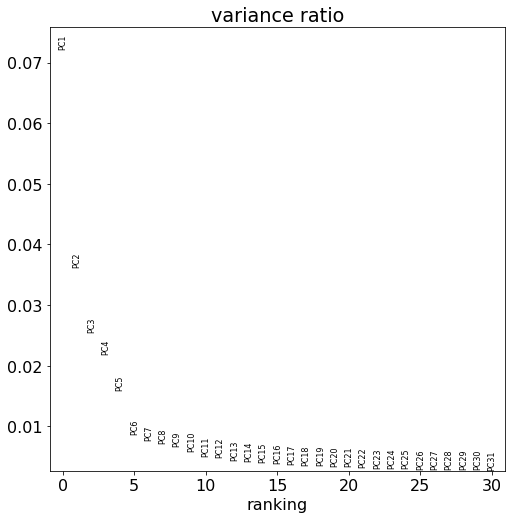

In [38]:
sc.settings.figdir = '/domino/edv/id-td-virology/Zhiyuan/public/Gut_remap/figure/B_cells/cluster/'
pca_elbow(adata_B, 2000, 50, 'total')

In [39]:
adata_B.obs

,sample_id,n_genes_by_counts,total_counts,pct_counts_in_top_50_genes,total_counts_mt,pct_counts_mt,cell_quality,nCount_RNA,nFeature_RNA,RNA_snn_res.0.1,seurat_clusters,clusternames
AAGTCTGGTGATGTCT-1-P190801_Liver_1,P190801_Liver_1,1340,3115,31.300161,178,5.714286,high,3115,1340,5,5,B
AATCGGTCAGCGTCCA-1-P190801_Liver_1,P190801_Liver_1,1448,10171,75.892243,349,3.431324,high,10171,1448,10,10,B
ACACTGAGTCTGCCAG-1-P190801_Liver_1,P190801_Liver_1,1514,7657,65.129946,750,9.794959,high,7657,1514,10,10,B
ACATGGTAGGTTCCTA-1-P190801_Liver_1,P190801_Liver_1,1823,5402,36.023695,239,4.424287,high,5402,1823,5,5,B
ACATGGTGTTTCGCTC-1-P190801_Liver_1,P190801_Liver_1,1312,3733,39.646397,286,7.661398,high,3733,1312,5,5,B
...,...,...,...,...,...,...,...,...,...,...,...,...
TTTCCTCTCTCAACTT-1-P190402_Liver_1,P190402_Liver_1,2436,7237,29.625535,390,5.388973,high,7237,2436,5,5,B
TTTGCGCGTAAGTTCC-1-P190402_Liver_1,P190402_Liver_1,2194,19672,68.340789,142,0.721838,high,19672,2194,10,10,B
TTTGGTTCAAGTCATC-1-P190402_Liver_1,P190402_Liver_1,1480,3566,31.660123,216,6.057207,high,3566,1480,5,5,B
TTTGGTTGTTACCGAT-1-P190402_Liver_1,P190402_Liver_1,1750,5493,34.516658,163,2.967413,high,5493,1750,5,5,B


In [40]:
adata_B.obs['tissue'] = adata_B.obs.sample_id.str.split('_', expand = True)[1]

In [41]:
adata_B.obs.groupby('tissue').size()

tissue
Blood    23977
Liver     5500
dtype: int64

In [44]:
#USE bbknn instead of neighbors() to build the graph
sc.external.pp.bbknn(adata_B, batch_key='tissue', neighbors_within_batch=10, n_pcs=15)


In [48]:
adata_B.uns

OverloadedDict, wrapping:
	OrderedDict([('log1p', {'base': None}), ('hvg', {'flavor': 'cell_ranger'}), ('pca', {'params': {'zero_center': True, 'use_highly_variable': True}, 'variance': array([13.917756  ,  6.9916096 ,  4.9321647 ,  4.2257433 ,  3.091546  ,
        1.6818658 ,  1.4818463 ,  1.4080367 ,  1.3062361 ,  1.1552433 ,
        0.9715137 ,  0.9433774 ,  0.84299654,  0.81206197,  0.79266614,
        0.76283664,  0.730072  ,  0.69834864,  0.6840371 ,  0.6698726 ,
        0.65119964,  0.6347528 ,  0.6155812 ,  0.59258467,  0.58721507,
        0.5785587 ,  0.5658131 ,  0.56564015,  0.563972  ,  0.5531762 ,
        0.5405242 ,  0.52832913,  0.52500564,  0.5167698 ,  0.5084917 ,
        0.5053461 ,  0.4942604 ,  0.49116787,  0.48257768,  0.47332537,
        0.47140935,  0.46789813,  0.46655336,  0.46299735,  0.45891568,
        0.45673472,  0.45312518,  0.4503754 ,  0.4488353 ,  0.44261816],
      dtype=float32), 'variance_ratio': array([0.07220439, 0.036272  , 0.02558774, 0.02192287

In [49]:
res_list = [0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.6, 0.8, 1, 1.5, 2, 2.5, 3]
temp_adata = adata_B.copy()
test_df, info_df = sil_cal(temp_adata, res_list, n_knn_pcs = 15)

At resolution 0.01 the average silhouette score is 0.5347428321838379
At resolution 0.05 the average silhouette score is 0.31076303124427795
At resolution 0.1 the average silhouette score is 0.1966816633939743
At resolution 0.2 the average silhouette score is 0.20508836209774017
At resolution 0.3 the average silhouette score is 0.20151925086975098
At resolution 0.4 the average silhouette score is 0.12535147368907928
At resolution 0.6 the average silhouette score is 0.09594880044460297
At resolution 0.8 the average silhouette score is 0.10615263879299164
At resolution 1 the average silhouette score is 0.0895775556564331
At resolution 1.5 the average silhouette score is 0.09588147699832916
At resolution 2 the average silhouette score is 0.08615656197071075
At resolution 2.5 the average silhouette score is 0.07082225382328033
At resolution 3 the average silhouette score is 0.06573791056871414


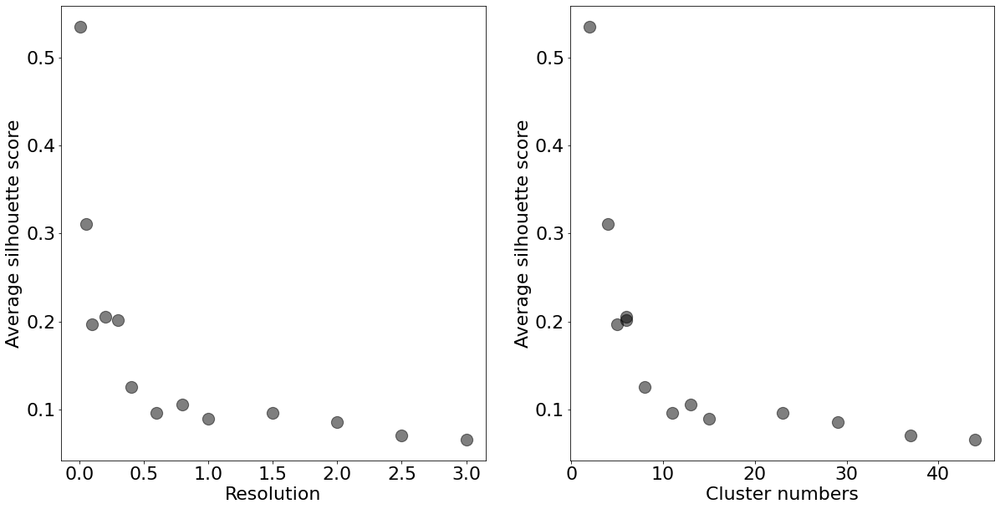

In [50]:
figpath = '/domino/edv/id-td-virology/Zhiyuan/public/Gut_remap/figure/B_cells/cluster/'
summary_plot(info_df, figpath, 'sil_summary_total.png')

In [51]:
#try resolution 0.2
adata_B.obs['leiden_r0.2'] = temp_adata.obs['res_0.2']
sc.tl.umap(adata_B)

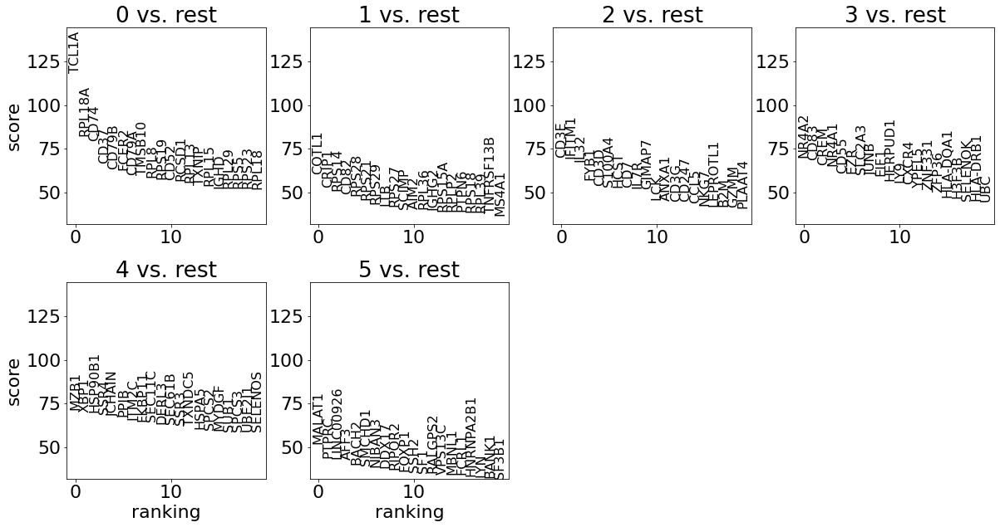

In [52]:
sc.tl.rank_genes_groups(adata_B, groupby='leiden_r0.2', key_added='rank_genes_r0.2', 
                        use_raw = False, method = 'wilcoxon')
rcParams['figure.figsize']=(5,5)
sc.pl.rank_genes_groups(adata_B, key='rank_genes_r0.2', fontsize=16, use_raw = False)

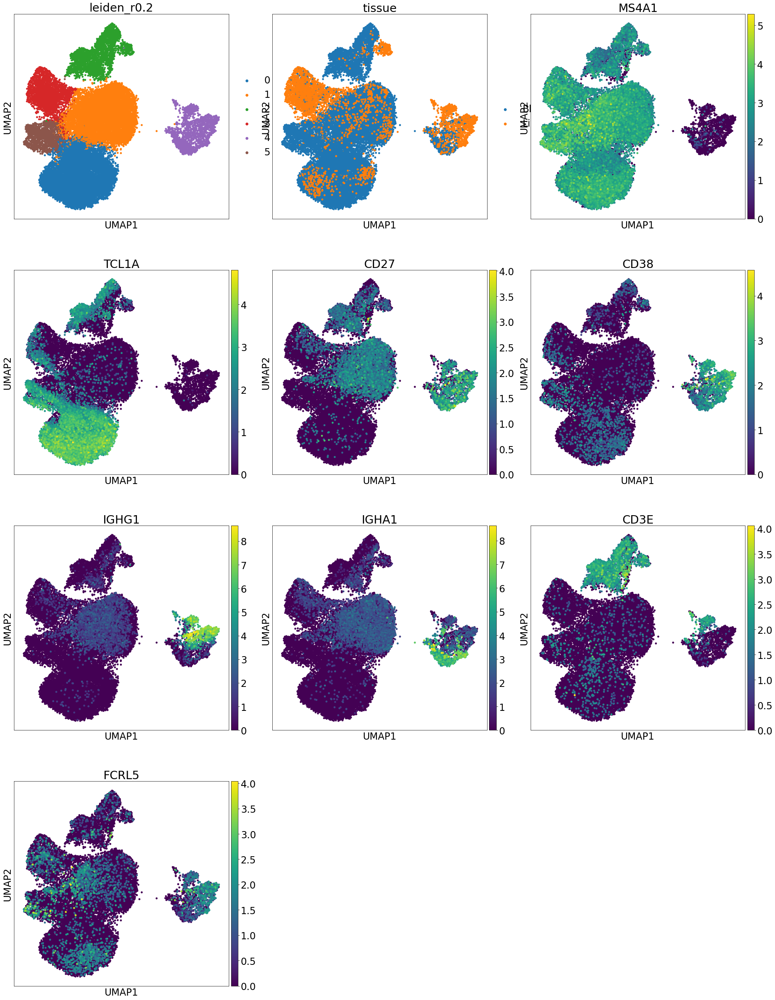

In [84]:
rcParams['figure.figsize']=(10,10)
sc.settings.figdir = '/domino/edv/id-td-virology/Zhiyuan/public/Gut_remap/figure/B_cells/cluster/'
sc.pl.umap(adata_B, color=['leiden_r0.2', 'tissue',
                                'MS4A1', 'TCL1A', 'CD27',
                                'CD38', 'IGHG1', 'IGHA1', 'CD3E', 'FCRL5'], 
           s =100, ncols = 3, save = '_b_total.png', use_raw = False)

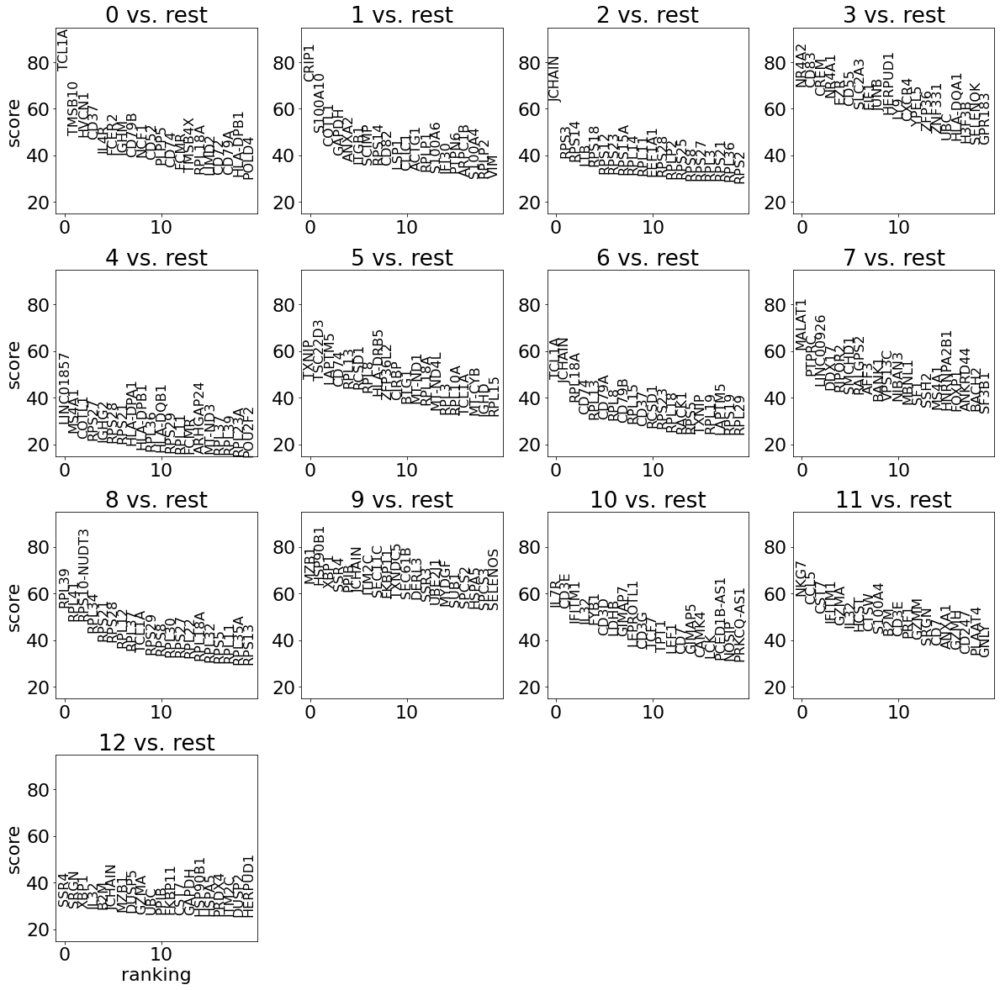

In [60]:
#try resolution 0.8
adata_B.obs['leiden_r0.8'] = temp_adata.obs['res_0.8']
sc.tl.rank_genes_groups(adata_B, groupby='leiden_r0.8', key_added='rank_genes_r0.8', 
                        use_raw = False, method = 'wilcoxon')
rcParams['figure.figsize']=(5,5)
sc.pl.rank_genes_groups(adata_B, key='rank_genes_r0.8', fontsize=16, use_raw = False)

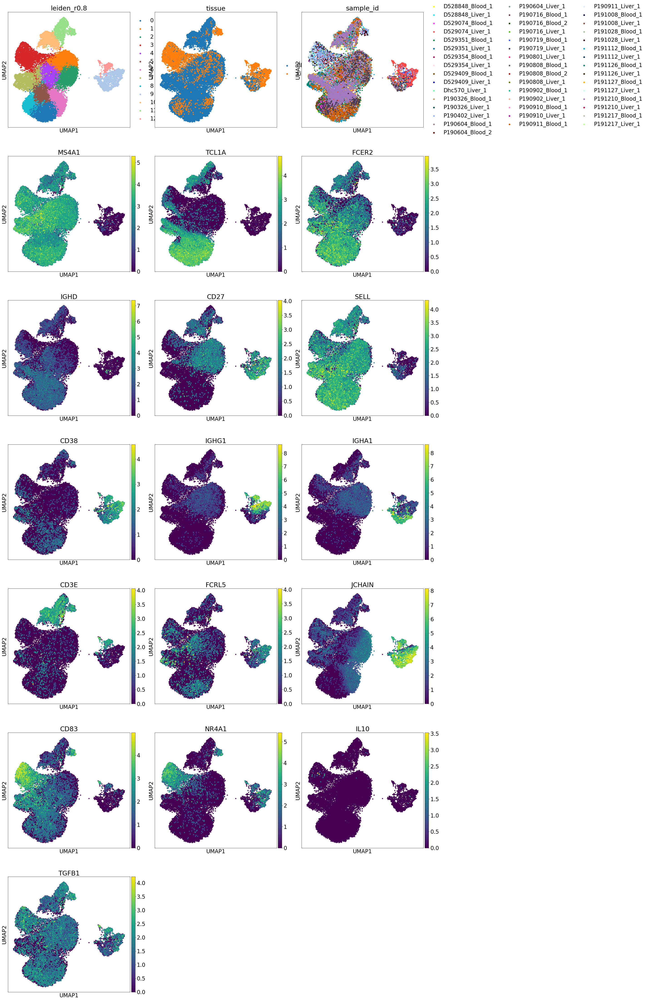

In [85]:
rcParams['figure.figsize']=(10,10)
sc.pl.umap(adata_B, color=['leiden_r0.8', 'tissue', 'sample_id',
                                'MS4A1', 'TCL1A', 'FCER2', 'IGHD', 'CD27', 'SELL',
                                'CD38', 'IGHG1', 'IGHA1', 'CD3E', 'FCRL5', 'JCHAIN', 'CD83', 'NR4A1', 'IL10', 'TGFB1'], 
           s =100, ncols = 3, save = '_b_total_r0.8.png', use_raw = False)

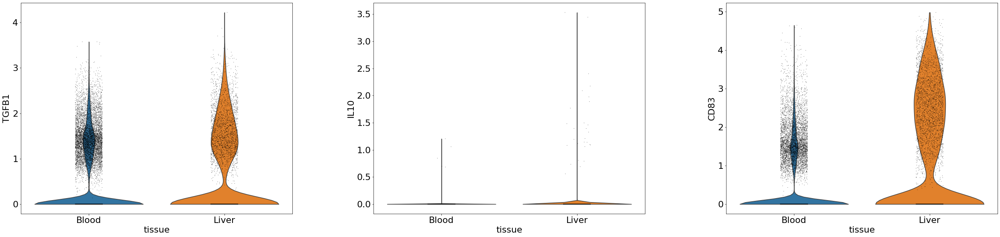

In [72]:
sc.pl.violin(adata_B, keys = ['TGFB1', 'IL10', 'CD83'], groupby = 'tissue')

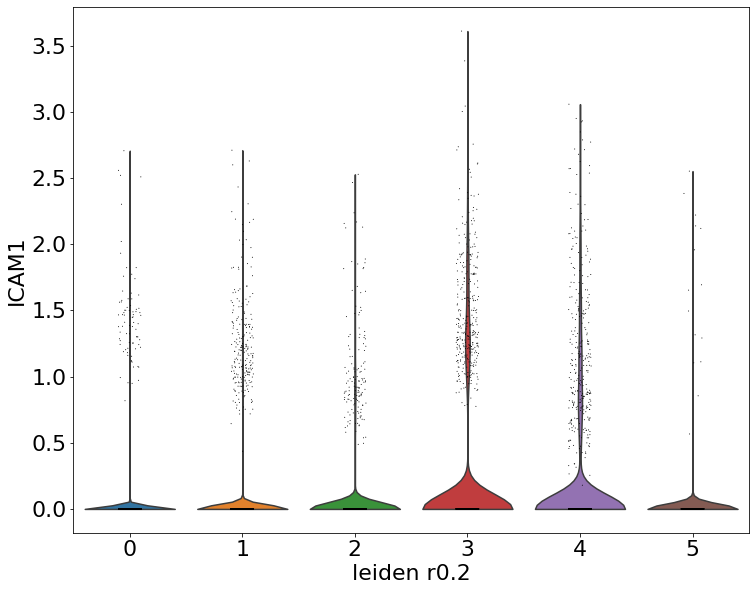

In [78]:
    sc.pl.violin(adata_B, keys = ['ICAM1'], groupby = 'leiden_r0.2')

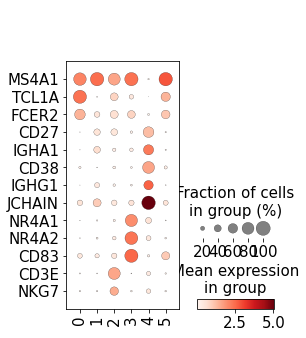

In [86]:
marker_genes = ['MS4A1', 'TCL1A', 'FCER2',
                'CD27', 'IGHA1', 
                'CD38', 'IGHG1', 'JCHAIN',
               'NR4A1', 'NR4A2', 'CD83',
               'CD3E', 'NKG7']

rcParams['font.size']=18
sc.pl.dotplot(adata_B, marker_genes, groupby='leiden_r0.2', use_raw=False, swap_axes = True, save = 'dotplot.png')

In [82]:
adata_B.obs['subtype'] = adata_B.obs['leiden_r0.2'].cat.add_categories(['Naive B', 'Memory B',
                                                                      'Antigen stimulated B', 'Plasma', 'doublets'])

adata_B.obs['subtype'][np.in1d(adata_B.obs['leiden_r0.2'], ['0', '5'])] = 'Naive B'
adata_B.obs['subtype'][np.in1d(adata_B.obs['leiden_r0.2'], ['1'])] = 'Memory B'
adata_B.obs['subtype'][np.in1d(adata_B.obs['leiden_r0.2'], ['3'])] = 'Antigen stimulated B'
adata_B.obs['subtype'][np.in1d(adata_B.obs['leiden_r0.2'], ['4'])] = 'Plasma'
adata_B.obs['subtype'][np.in1d(adata_B.obs['leiden_r0.2'], ['2'])] = 'doublets'

adata_B.obs['subtype'] = adata_B.obs['subtype'].cat.remove_unused_categories()

In [90]:
#add condition information
info_path = '/domino/edv/id-td-virology/Zhiyuan/public/Gut_remap/processed_data/patient_info.csv'
info_matrix = pd.read_csv(info_path, sep = ',', index_col = 0)

In [112]:
adata_B.obs.loc[:,'disease_stage'] = ''
adata_B.obs.loc[:,'gender'] = ''
adata_B.obs.loc[:,'patient_ID'] = adata_B.obs.sample_id.str.split('_', expand = True)[0]
for ind in info_matrix.index:
    gender = info_matrix.loc[ind, 'Gender']
    ds = info_matrix.loc[ind, 'Disease Stage']
    row_ind = adata_B.obs.loc[adata_B.obs.patient_ID == ind].index
    adata_B.obs.loc[row_ind, 'gender'] = gender
    adata_B.obs.loc[row_ind, 'disease_stage'] = ds

/opt/conda/lib/python3.8/site-packages/pandas/core/indexing.py:1773: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


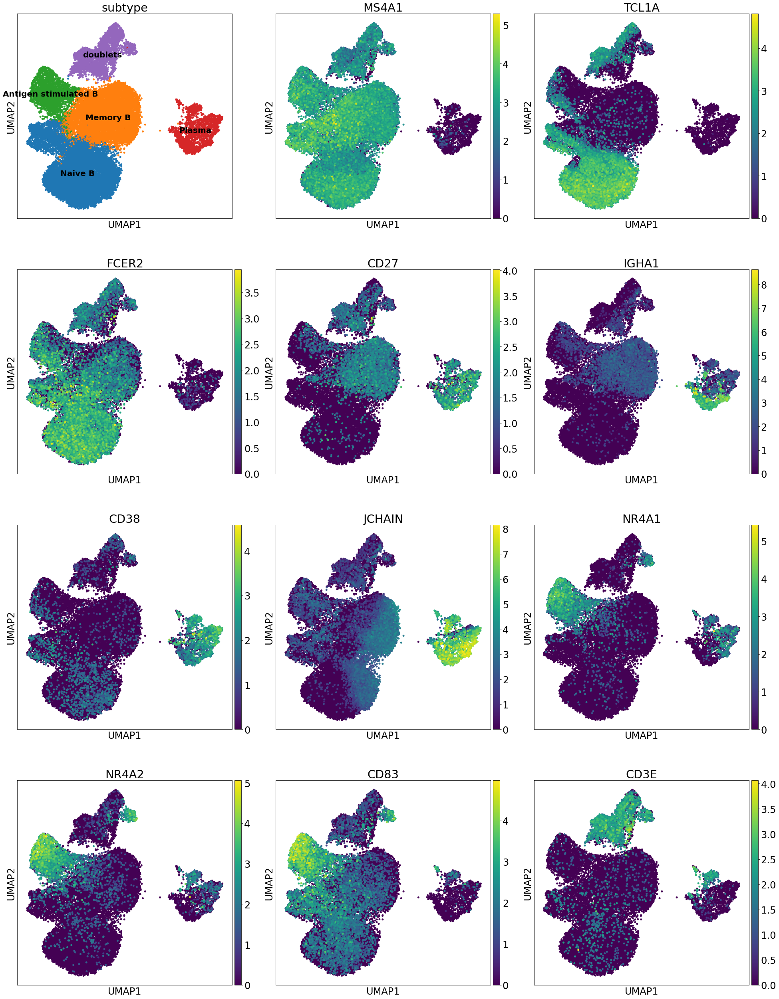

In [118]:
rcParams['figure.figsize']=(10,10)
rcParams['font.size']=24
sc.pl.umap(adata_B, color=['subtype', 
                           'MS4A1', 'TCL1A', 'FCER2',
                           'CD27', 'IGHA1',
                           'CD38', 'JCHAIN',
                           'NR4A1', 'NR4A2', 'CD83',
                           'CD3E'], 
           legend_loc = 'on data', legend_fontsize=20, s =100, ncols = 3, save = '_total_final.png', use_raw = False)

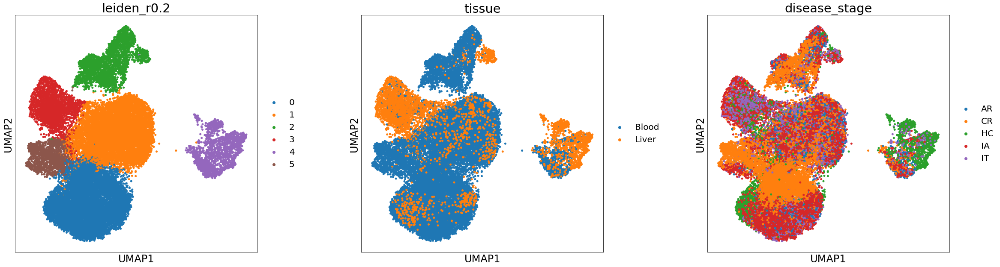

In [123]:
rcParams['figure.figsize']=(10,10)
rcParams['font.size']=24
sc.pl.umap(adata_B, color=['leiden_r0.2', 'tissue', 'disease_stage'], wspace = 0.3,
legend_fontsize=20, s =100, ncols = 3, save = '_total_final_2.png', use_raw = False)




In [117]:
#write data
savepath = '/domino/edv/id-td-virology/Zhiyuan/public/Gut_remap/processed_data/B_cells.h5ad'
adata_B.write(savepath)

In [134]:
adata_B.obs[adata_B.obs['leiden_r0.2'] == '3'].groupby(['disease_stage', 'patient_ID'], observed = True).size()

disease_stage  patient_ID
IA             P190801        47
               P191112       257
               P190719       132
               P190911       345
               P191028       133
CR             P191126       123
               P191127       228
               P191210         4
HC             D529351        41
               D529409        40
               D528848       270
               D529354        36
               Dhc570        151
               D529074        68
AR             P190716        51
               P191217        59
               P191008         2
IT             P190910        23
               P190808       135
               P190902        26
               P190604        96
               P190326         3
               P190402       202
dtype: int64

In [128]:
adata_B.obs[adata_B.obs['leiden_r0.2'] != '4'].groupby('disease_stage').size()

disease_stage
AR    2846
CR    9716
HC    3883
IA    6243
IT    4790
dtype: int64

In [158]:
test = adata_B[adata_B[:,'IL10'].X != 0]

In [159]:
test.obs.loc[test.obs.subtype == 'Antigen stimulated B'].groupby('disease_stage').size()

disease_stage
AR    3
CR    1
HC    3
IA    6
IT    9
dtype: int64

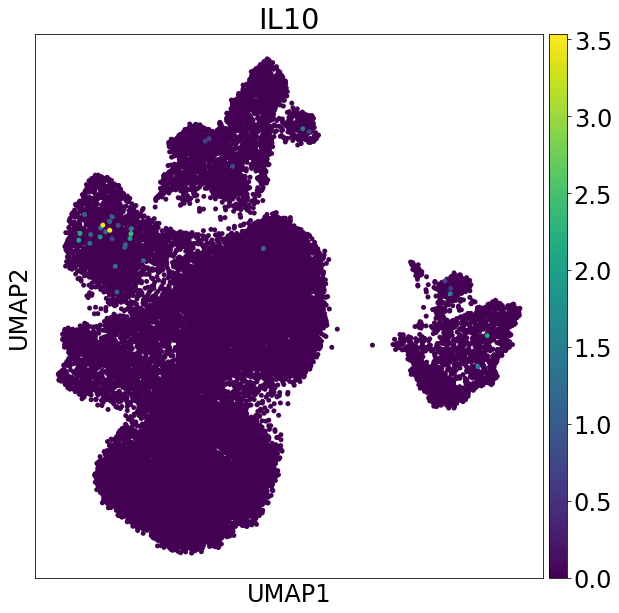

In [164]:
rcParams['figure.figsize']=(10,10)
rcParams['font.size']=24
sc.pl.umap(adata_B, color=['IL10'], wspace = 0.3,
legend_fontsize=20, s =100, ncols = 3,  use_raw = False)

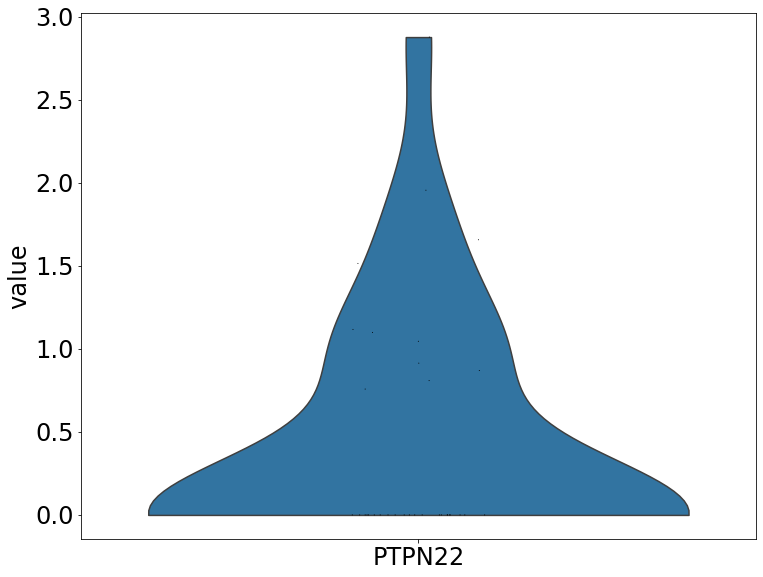

In [168]:
sc.pl.violin(test, ['PTPN22'], use_raw = False)